In [1]:
cd /data/store01/data_dirs/students/ucfafyi/Sentinel

/data/store01/data_dirs/students/ucfafyi/Sentinel


In [2]:
import sys
sys.path.insert(0, 'python')
from readSent import *
from nicer_plot import *
import pylab as plt
%matplotlib inline
#from PIL import ImageEnhance
from matplotlib import cm
from skimage import exposure
from sklearn import linear_model
import scipy
from scipy import signal
import scipy.stats
import scipy.ndimage as ndimage
from fastRWpkl import *
from scipy.stats import gaussian_kde
from matplotlib import *

In [3]:
fhead = 'data/50SMG20165100'

In [4]:
bands = readfile([2,3,4], fhead)

No meteo data!!!


In [5]:
b2 = bands['B02']; 
b3= bands['B03']; 
b4 = bands['B04']

In [6]:
bgr = np.zeros((10980, 10980, 3))

In [8]:
bgr[:,:,0] = b4
bgr[:,:,1] = b3
bgr[:,:,2] = b2

In [70]:
def gaussian(xwin, ywin, xstd, ystd, angle, norm = True):
    win = max(xwin, ywin)
    winx = win*2**0.5
    winy = win*2**0.5
    
    xstd = xstd
    ystd = ystd
        
    xgaus = signal.gaussian(winx, xstd)
    ygaus = signal.gaussian(winy, ystd)
    gaus  = np.outer(xgaus, ygaus)
    r_gaus = scipy.ndimage.interpolation.rotate(gaus, angle, reshape=True)
    center = np.array(r_gaus.shape)/2
    cgaus = r_gaus[center[0]-xwin/2: center[0]+xwin/2, center[1]-ywin/2:center[1]+ywin/2]
    if norm:
        return cgaus/cgaus.sum()
    else:
        return cgaus

In [8]:
data = parallel_rw_pkl(None, 'inter_sent%i'%2, 'r')
mask = parallel_rw_pkl(None, 'inter_sentm%i'%2, 'r')
centers = parallel_rw_pkl(None, 'Sindex', 'r')

In [9]:
data[mask] = np.nan

In [10]:
modis = data

In [18]:
sen = b4[1000:2000,5000:6000]

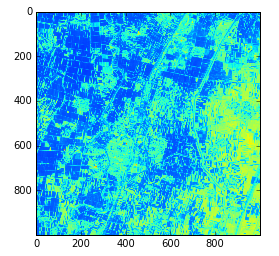

In [12]:
plt.imshow(sen, vmin=0, vmax=0.4)

In [20]:
mod = data[1000:2000, 5000:6000]/1000.

/home/ucfafyi/.conda/envs/gdal_env/lib/python2.7/site-packages/matplotlib/font_manager.py:1288: UserWarning: findfont: Font family [u'sans-serif'] not found. Falling back to Bitstream Vera Sans
  (prop.get_family(), self.defaultFamily[fontext]))


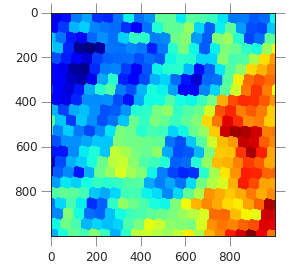

In [21]:
plt.imshow(mod)

In [37]:
vmin = np.nanmin([sen, mod])
vmax = np.nanmax([sen, mod])

In [38]:
vmin, vmax

(0.045395576909325011, 0.4083)

In [52]:
ker1 = gaussian(120, 120, 20, 300, 8)
ker2 = np.ones((120, 120))/(120.*120.)

In [13]:
sen_Gcon = signal.fftconvolve(b4, ker1, mode='same')
sen_Acon = signal.fftconvolve(b4, ker2, mode='same')

In [21]:
x, y = centers[0], centers[1]
m = (x>2000)&(x<3000)*(y>5000)*(y<6000)
px, py = x[m],y[m]

cx = -22; cy = 60
#gm = (x+cx>2000)&(x+cx<3000)*(y+cy>5000)*(y+cy<6000)
gpx, gpy = px+cx, py+cy

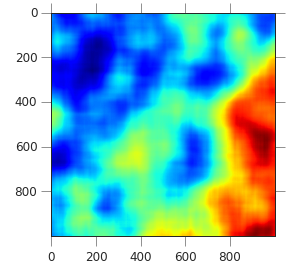

In [26]:
plt.imshow(sen_Acon[1000:2000,5000:6000])

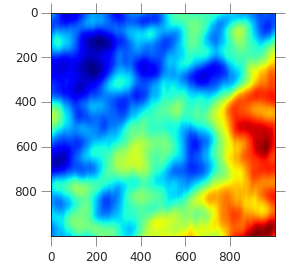

In [27]:
plt.imshow(sen_Gcon[1000:2000,5000:6000])

In [24]:
sen_Gcon.max(), sen_Gcon.min()

(0.52042212328079751, 0.025525119314673911)

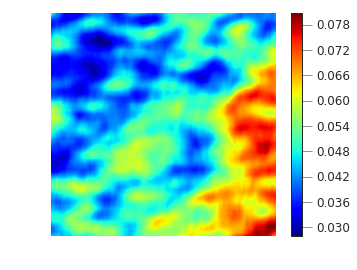

In [25]:
plt.imshow(sen_Gcon[1000:2000,5000:6000]-sen_Acon[1000:2000,5000:6000])
plt.axis('off')
plt.colorbar()

In [28]:
s1 = slice(500,2500); s2 = slice(6500, 8500)
to_conv = b4[s1,s2]
to_conv

array([[ 0.1252,  0.1343,  0.1416, ...,  0.1699,  0.1906,  0.1884],
       [ 0.1025,  0.1096,  0.1206, ...,  0.1834,  0.1863,  0.1765],
       [ 0.0944,  0.0949,  0.0988, ...,  0.1667,  0.1675,  0.1612],
       ..., 
       [ 0.1438,  0.1185,  0.1236, ...,  0.0941,  0.0854,  0.0885],
       [ 0.1336,  0.1133,  0.1257, ...,  0.094 ,  0.0867,  0.0889],
       [ 0.1301,  0.1119,  0.1263, ...,  0.0894,  0.0861,  0.0879]])

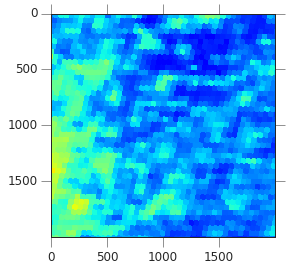

In [45]:
to_comp = modis[s1,s2]*0.001
plt.imshow(to_comp, vmin=0, vmax=0.3)

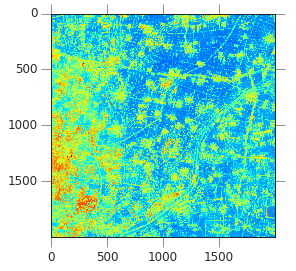

In [46]:
plt.imshow(to_conv,vmin=0, vmax=0.3)

In [31]:
cx, cy = centers

In [32]:
x = cx[(cx>1000)&(cx<2000)&(cy>7000)&(cy<8000)]
y = cy[(cx>1000)&(cx<2000)&(cy>7000)&(cy<8000)]

In [33]:
def plot_ling(ax, m, s):
    cmap = cm.get_cmap('YlGnBu')
    mval = np.nanmax([s,m])
    fit = np.polyfit(m,s,1)
    fit_fn = np.poly1d(fit)
    xy = np.vstack([m,s])
    z = gaussian_kde(xy)(xy)
    ax.scatter(m,s, c=z, s=4, edgecolor='',norm=colors.LogNorm(vmin=z.min(), vmax=z.max()*1.2), cmap = cmap)
    ax.plot([0,1],[0.,1], '--',linewidth=0.5)
    ax.plot(np.arange(0,1,0.1), fit_fn(np.arange(0,1,0.1)), '--', color='grey')
    slope,inter, rval, pval, std = r = scipy.stats.linregress(m,s)
    #ax.set_title('%s'%names[i])
    ax.text(mval*(4./6.),mval*(1.5/6.), 'y = %.02fx + %.02f'%(slope, inter)+ '\n'+ r'${r^2}$'+': %.02f'%rval)
    pretty_axes(ax)
    ax.set_xlim(0,mval)
    ax.set_ylim(0,mval)
    ax.set_yticks(np.linspace(0,mval,5))
    ax.set_xticks(np.linspace(0,mval,5))
    return ax

In [34]:
plot_config()

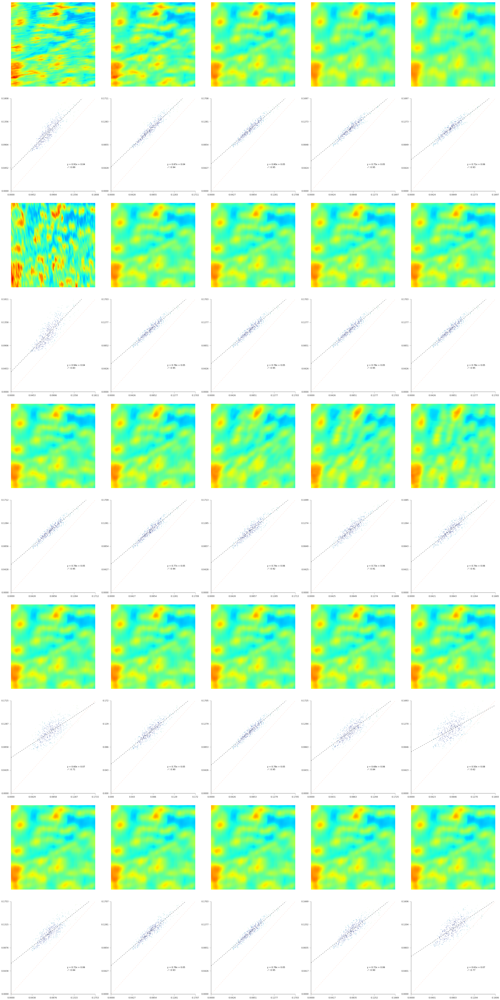

In [71]:
sx = -20; sy = 61
p = [24, 305, 8, -21, 60]
bounds = [1,50, 10], [1, 1000, 200], [0, 100, 20], [-60, 40, 20], [20, 120, 20]
fig = plt.figure(figsize=(40,80))
vmin = 0.02
vmax = 0.22
for ii in range(5):
    bound = bounds[ii]
    for i,j in enumerate(range(bound[0],bound[1], bound[2])):
        p = [24, 305, 8, -21, 60]
        p[ii] = j
        A_regs = []; G_regs = []
        ker1 = gaussian(120, 120, p[0], p[1], p[2])
        sen_Gcon = signal.fftconvolve(to_conv, ker1, mode='same')
        #sen_Acon = signal.fftconvolve(to_conv, ker2, mode='same')
        ref = to_comp[x-1000+500, y-7000+500]
        #A_regs = sen_Acon[x-1000+500, y-7000+500]
        G_regs = sen_Gcon[x-1000+500+p[3], y-7000+500+p[4]]
        #a_area = sen_Acon[500:1500, 500:1500]
        g_area = sen_Gcon[500:1500, 500:1500]
        ax1 = fig.add_subplot(10,5,ii*10+i+1)
        ax1.imshow(g_area, vmax=vmax, vmin=vmin, interpolation = 'None')
        ax1.axis('off')
        slope, inter, rval, pval, stderr =  linregress(ref, G_regs)
        ax2 = fig.add_subplot(10,5,ii*10+i+1+5)
        plot_ling(ax2, ref, G_regs)   
plt.tight_layout()

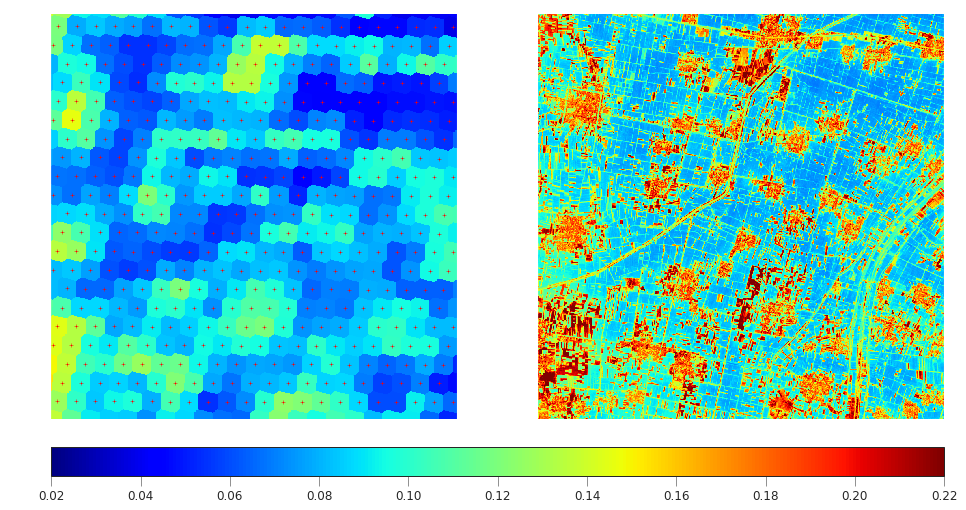

In [44]:
fig = plt.figure(figsize = (16,8))
ax1 = fig.add_subplot(1,2,1)
ax1.imshow(to_comp[500:1500, 500:1500], vmax=vmax, vmin=vmin, interpolation ='None')
ax1.plot(y-7000, x-1000, 'r+', markersize=4)
ax1.set_xlim(0,1000)
ax1.set_ylim(1000,0)
vmin = 0.02
vmax = 0.22
ax1.axis('off')
ax2 = fig.add_subplot(1,2,2)
im = ax2.imshow(to_conv[500:1500, 500:1500], vmax=vmax, vmin=vmin,interpolation ='None')
#ax1.plot(y-7000, x-1000, 'r+', markersize=4)
ax2.set_xlim(0,1000)
ax2.set_ylim(1000,0)
ax2.axis('off')
fig.subplots_adjust(bottom=0.1)
cbar_ax = fig.add_axes([0.125, 0.05, 0.775, 0.05])
fig.colorbar(im, cax=cbar_ax, orientation='horizontal')

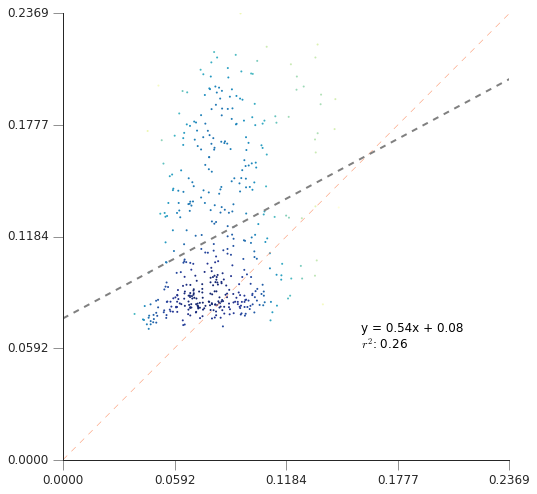

In [59]:
fig = plt.figure(figsize=(8,8))
ax = fig.add_subplot(1,1,1)
plot_ling(ax, to_comp[x-1000+500, y-7000+500], to_conv[x-1000+500, y-7000+500])

In [50]:
to_comp

array([[ 0.07503064,  0.07503064,  0.07503064, ...,  0.10136045,
         0.10136045,  0.10136045],
       [ 0.07503064,  0.07503064,  0.07503064, ...,  0.10136045,
         0.10136045,  0.10136045],
       [ 0.07503064,  0.07503064,  0.07503064, ...,  0.10136045,
         0.10136045,  0.10136045],
       ..., 
       [ 0.14751085,  0.14751085,  0.14751085, ...,  0.07115965,
         0.07115965,  0.07115965],
       [ 0.14751085,  0.14751085,  0.14751085, ...,  0.07115965,
         0.07115965,  0.07115965],
       [ 0.14751085,  0.14751085,  0.14751085, ...,  0.07115965,
         0.07115965,  0.07115965]])

In [48]:
vmin, vmax

(0.02, 0.22)

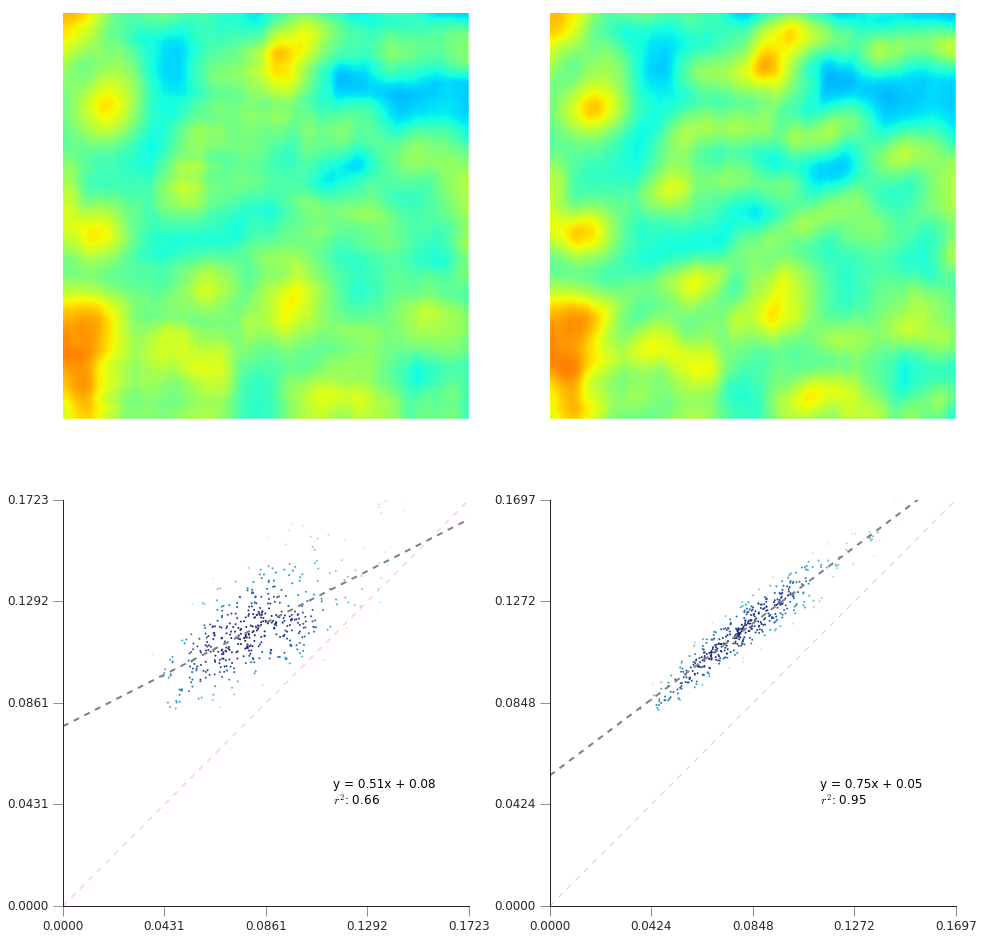

In [72]:
fig = plt.figure(figsize=(16,16))
p = [30, 305, 8, -21, 60]
ker1 = gaussian(120, 120, p[0], p[1], p[2])
sen_Gcon = signal.fftconvolve(to_conv, ker1, mode='same')
sen_Acon = signal.fftconvolve(to_conv, ker2, mode='same')
ref = to_comp[x-1000+500, y-7000+500]
A_regs = sen_Acon[x-1000+500, y-7000+500]
G_regs = sen_Gcon[x-1000+500+p[3], y-7000+500+p[4]]
a_area = sen_Acon[500:1500, 500:1500]
g_area = sen_Gcon[500:1500, 500:1500]
ax1 = fig.add_subplot(2,2,1)
ax1.imshow(a_area,vmax=vmax, vmin=vmin,interpolation ='None')
ax1.axis('off')
ax2 = fig.add_subplot(2,2,2)
ax2.imshow(g_area, vmax=vmax, vmin=vmin, interpolation ='None')
ax2.axis('off')
slope, inter, rval, pval, stderr =  linregress(ref, G_regs)
ax3 = fig.add_subplot(2,2,3)
plot_ling(ax3, ref, A_regs)
slope, inter, rval, pval, stderr =  linregress(ref, G_regs)
ax4 = fig.add_subplot(2,2,4)
plot_ling(ax4, ref, G_regs)

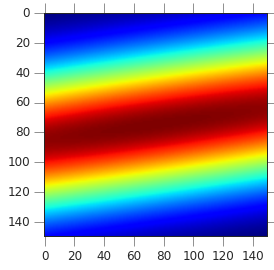

In [61]:
plt.imshow(ker1)

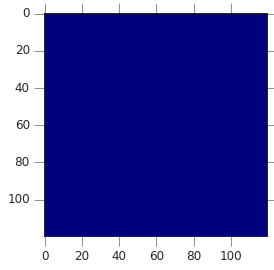

In [66]:
plt.imshow(ker2)

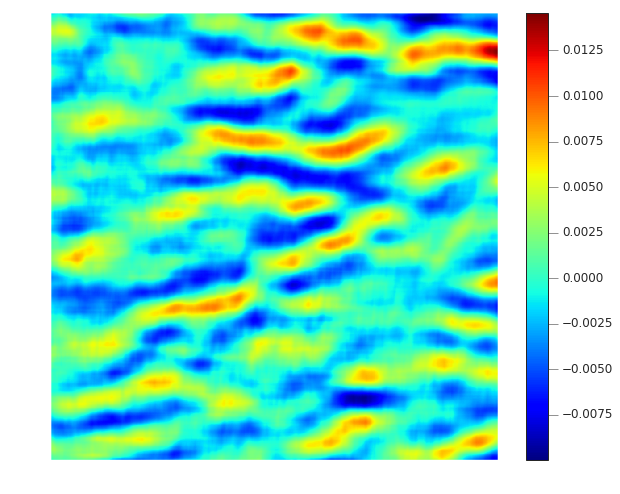

In [73]:
plt.figure(figsize=(10,8))
plt.imshow(g_area-a_area,interpolation='None')
plt.axis('off')
plt.colorbar()

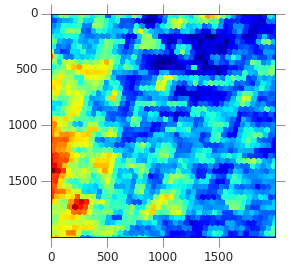

In [58]:
plt.imshow(modis[500:2500, 6500:8500])

In [274]:
g_reg = sen_Gcon[gpx, gpy]
a_reg = sen_Acon[px, py]
m_ref = modis[px, py]

In [275]:
g_reg.shape

(451,)

In [276]:
a_reg.shape

(451,)

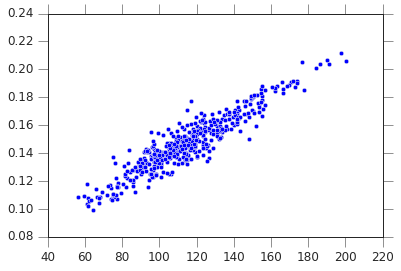

In [277]:
plt.scatter(m_ref, g_reg)

In [2]:
plt.scatter(m_ref, a_reg)

NameError: name 'plt' is not defined

In [15]:
def ransaclin(x,y):
    y, x = y.reshape((len(y),1)), x.reshape((len(x),1))
    model = linear_model.LinearRegression()
    model.fit(x, y)

    model_ransac = linear_model.RANSACRegressor(linear_model.LinearRegression())
    model_ransac.fit(x, y)
    inlier_mask = model_ransac.inlier_mask_
    return x[inlier_mask], y[inlier_mask]

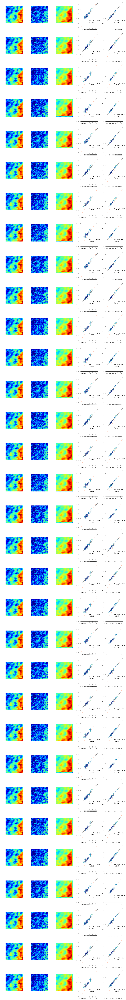

In [45]:
x, y = centers[0], centers[1]
to_conv = b4[800:2160, 4800:6160]
m = (x>1000)&(x<2000)*(y>5000)*(y<6000)
px, py = x[m],y[m]
m_ref = modis[px, py]*0.001
fig = plt.figure(figsize=(16, 128))
cmap = cm.get_cmap('YlGnBu')
a_con = signal.fftconvolve(to_conv, ker1, mode='same')
apx = px-1000+200; apy = py - 5000+200
a_reg = a_con[apx, apy]
i=0
for xstd in range(20,60, 20):
    for ystd in range(150, 450, 150):
        for angle in range(4,12,4):
            for sx in range(-40, 0, 20):
                for sy in range(40, 80, 20):
                    
                    ker2 = gaussian(150, 150, xstd, ystd, angle)
                    g_con = signal.fftconvolve(to_conv, ker2, mode='same')
                    gpx = px-1000+200; gpy = py - 5000+200
                    
                    g_reg = g_con[gpx+sx, gpy+sy]
                    ax1 = fig.add_subplot(32, 5, 5*i+1)
                    ax1.axis('off')
                    ax1.imshow(modis[1000:2000, 5000:6000])
                    ax2 = fig.add_subplot(32, 5, 5*i+2)
                    ax2.imshow(b4[1000:2000, 5000:6000])
                    ax2.axis('off')
                    ax3 = fig.add_subplot(32, 5, 5*i+3)
                    ax3.imshow(a_con[200:1700, 200:1700])
                    ax3.axis('off')
                    ax4 = fig.add_subplot(32, 5, 5*i+4)
                    #x, y = ransaclin( m_ref, a_reg)
                    m = (m_ref<1)&(m_ref>0)&(a_reg>0)&(a_reg<1)
                    plot_ling(ax4, m_ref[m], a_reg[m])
                    ax5 = fig.add_subplot(32, 5, 5*i+5)
                    #x, y = ransaclin( m_ref, g_reg)
                    m = (m_ref<1)&(m_ref>0)&(g_reg>0)&(g_reg<1)
                    plot_ling(ax5, m_ref[m], g_reg[m]) 
                    i+=1
                    for ii in [ax4, ax5]:
                        pretty_axes(ii)
                    
                    #print xstd, ystd, angle, sx,sy
                    #print linregress(m_ref*0.001, a_reg)
                    #print linregress(m_ref*0.001, g_reg)
                    
                    #i+=1
plt.tight_layout()

In [38]:
def plot_ling(ax, m, s):
    mval = np.nanmax([s,m])
    fit = np.polyfit(m,s,1)
    fit_fn = np.poly1d(fit)
    xy = np.vstack([m,s])
    z = gaussian_kde(xy)(xy)
    ax.scatter(m,s, c=z, s=4, edgecolor='',norm=colors.LogNorm(vmin=z.min(), vmax=z.max()*1.2), cmap = cmap)
    ax.plot([0,1],[0.,1], '--',linewidth=0.5)
    ax.plot(np.arange(0,1,0.1), fit_fn(np.arange(0,1,0.1)), '--', color='grey')
    slope,inter, rval, pval, std = r = scipy.stats.linregress(m,s)
    #ax.set_title('%s'%names[i])
    ax.text(mval*(4./6.),mval*(1.5/6.), 'y = %.02fx + %.02f'%(slope, inter)+ '\n'+ r'${r^2}$'+': %.02f'%rval)
    pretty_axes(ax)
    ax.set_xlim(0,mval)
    ax.set_ylim(0,mval)
    ax.set_yticks(np.arange(0,mval+0.1,mval/5.))
    ax.set_xticks(np.arange(0,mval+0.1,mval/5.))
    return ax
    
    
#if i==4:
 #   ax.set_xlabel ( "MOD reflectance")
  #  ax.set_ylabel ( "SEN reflectance")

In [ ]:
plot_config()
fig = plt.figure()
gs = gridspec.GridSpec(2,4)  # generate a grid space
fig = plt.figure(figsize=(24,12))
#names = ('SB2_MB3,SB3_MB4,SB4_MB1,SB8_MB2,SB8A_MB2,SB11_MB6,SB12_MB7').split(',')
cmap = cm.get_cmap('YlGnBu')
#psfsolve = []
for i in range(7):
    ax = fig.add_subplot(gs[i])
    data = np.array(to_regs[4+i])
    
    
    mod = data[0]
    sen = data[1]
    

    mval = np.nanmax([s,m])
    fit = np.polyfit(m,s,1)
    fit_fn = np.poly1d(fit)
    xy = np.vstack([m,s])
    z = gaussian_kde(xy)(xy)
    ax.scatter(m,s, c=z, s=4, edgecolor='',norm=colors.LogNorm(vmin=z.min(), vmax=z.max()*1.2), cmap = cmap)
    ax.plot([0,1],[0.,1], '--',linewidth=0.5)
    ax.plot(np.arange(0,1,0.1), fit_fn(np.arange(0,1,0.1)), '--', color='grey')
    slope,inter, rval, pval, std = r = scipy.stats.linregress(m,s)
    ax.set_title('%s'%names[i])
    ax.text(mval*(4./6.),mval*(1.5/6.),'slope: %02f \nintercept: %02f \ncorrelation: %02f \nstderr: %02f'%(slope,inter, rval, std), 
        )
    pretty_axes(ax)
    ax.set_xlim(0,mval)
    ax.set_ylim(0,mval)
    ax.set_yticks(np.arange(0,mval+0.1,mval/5.))
    ax.set_xticks(np.arange(0,mval+0.1,mval/5.))
    if i==4:
        ax.set_xlabel ( "MOD reflectance")
        ax.set_ylabel ( "SEN reflectance")
    psfsolve.append([slope,inter])
plt.tight_layout()